# Geometric & Intensity Transformations


Apply classical image processing operations using Python and the `(PIL)` library. Complete both tasks and save your output images for comparison.


In [1]:
# Import the library
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt

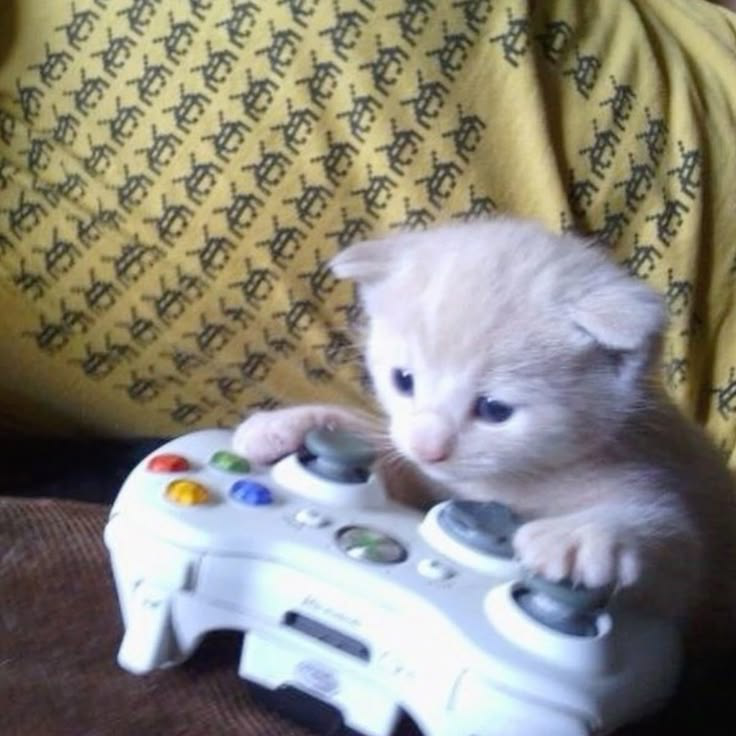

In [2]:
# ── Load image ────────────────────────────────────
img = Image.open("Kitty.jpg")

img

### 1. Scale (increase size)
Double the image dimensions using `Image.resize()` with high-quality resampling `(LANCZOS)`.

In [3]:
# Get the size of the image
width, height = img.size

# scaling factors
cx = 2
cy = 2

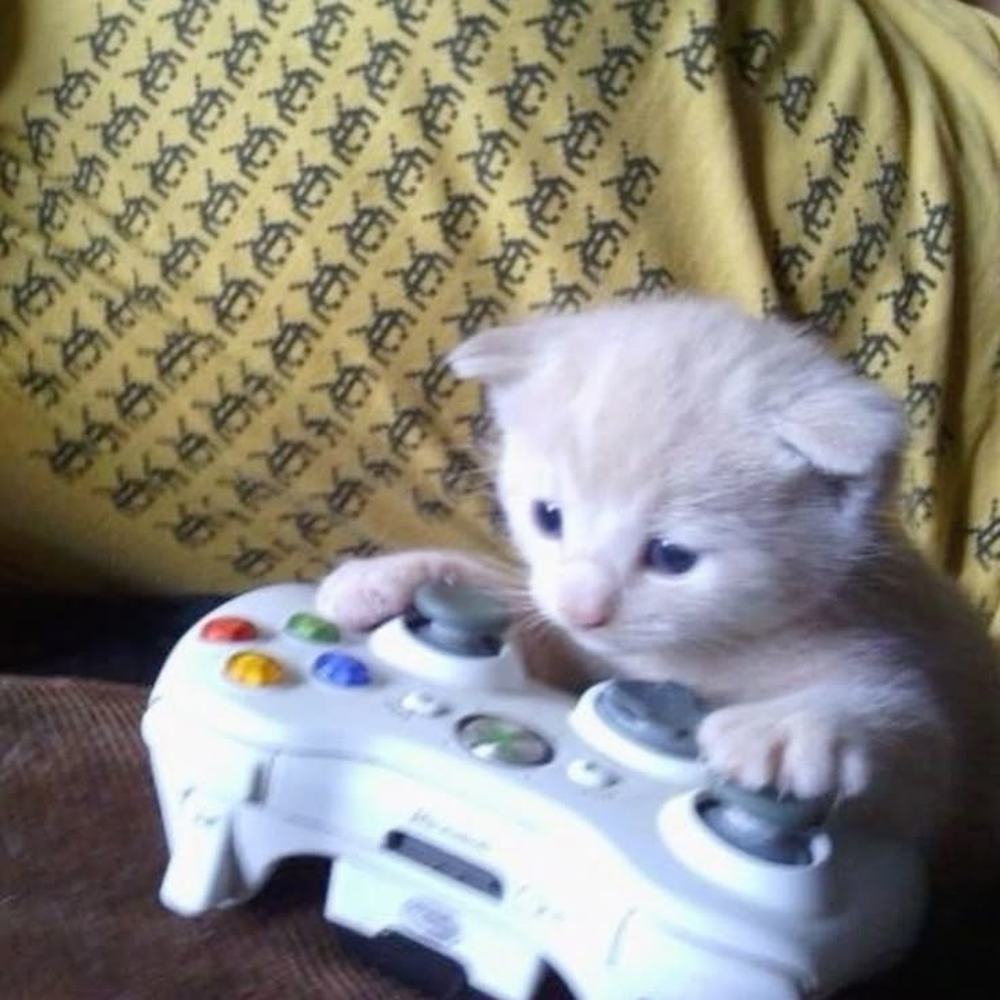

In [4]:
# ── 1. Increase size (scale ×2) ────────────────────

# Resize the image using PIL's built-in method
scaled_img = img.resize(
    (width * cx, height * cy),
    Image.Resampling.LANCZOS
)

scaled_img

In [5]:

# Save the scaled image and print the sizes (The new image name should be "task1_1_scaled.jpg")
scaled_img.save("task1_1_scaled.jpg")

print("Original size:", img.size)
print("Scaled size:", scaled_img.size)

Original size: (736, 736)
Scaled size: (1472, 1472)


 non-uniform scale (cx=2, cy=1) → stretch horizontally only

In [6]:
cx = 2
cy = 1

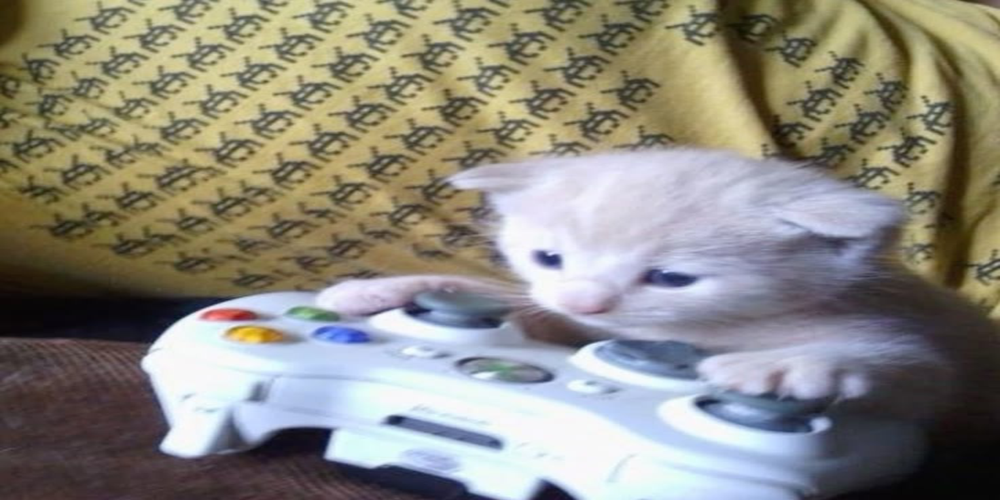

In [7]:
non_uniform_img = img.resize(
    (width * cx, height * cy),
    Image.Resampling.LANCZOS
)

non_uniform_img

In [8]:
print("Original size:", img.size)
print("Non-uniform scaled size:", non_uniform_img.size)

Original size: (736, 736)
Non-uniform scaled size: (1472, 736)


### 2. Rotate 120°
Rotate the image by 120 degrees, expanding the canvas to fit the full rotated image.

Original size: (736, 736)
Rotated size: (1006, 1006)


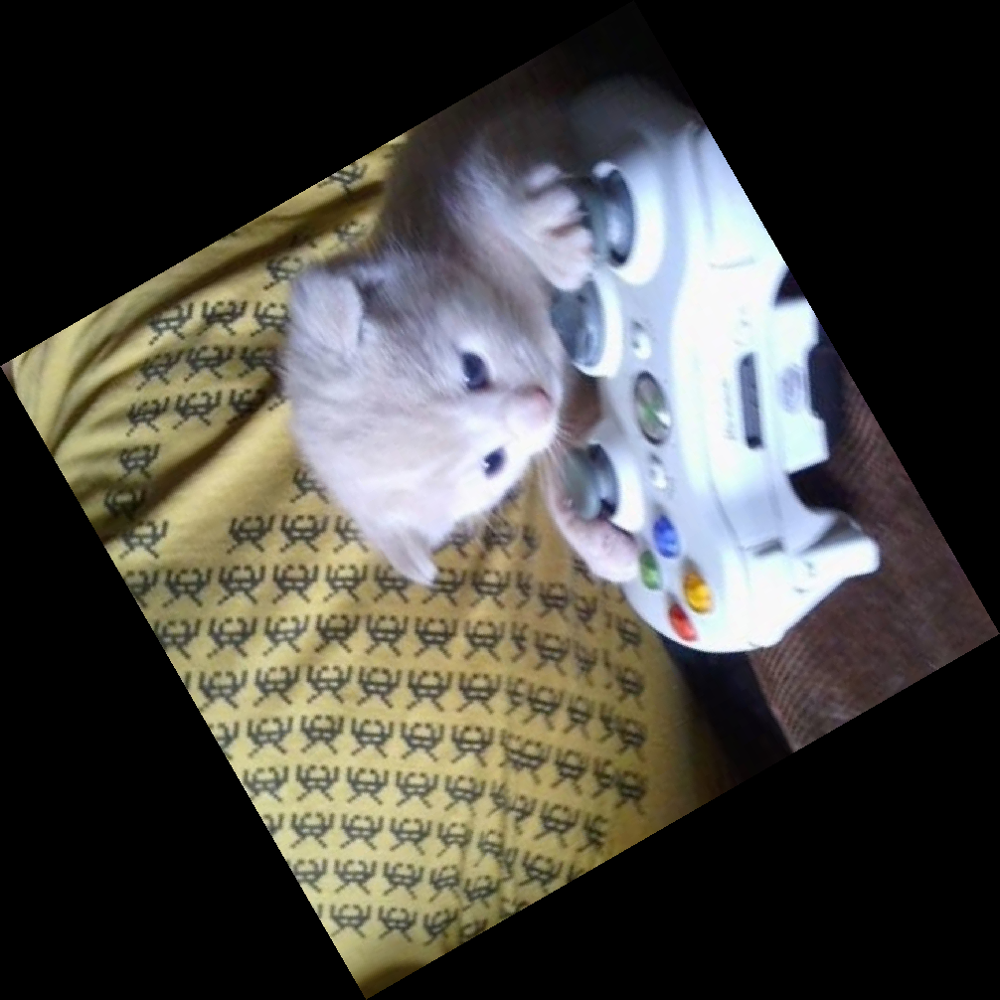

In [9]:
# ── 2. Rotate 120 degrees ──────────────────────────
# Save the scaled image and print the sizes (The new image name should be "task1_2_rotated.jpg")

rotated_img = img.rotate(120, expand=True)

rotated_img.save("task1_2_rotated.jpg")

print("Original size:", img.size)
print("Rotated size:", rotated_img.size)

rotated_img

### 3. Shear

In [10]:
# -- c. Get the image dimensions ────────────────────
width, height = img.size

In [12]:
# -- d. define the shear matrix ──────────────────────────
# Choose X-axis or Y-axis shear. The shear factor controls how much the image slants — start with 0.5 then experiment.
shx = 0.5
shy = 0

new_width = int(width + abs(shx) * height)

shear_matrix = (1, -shx, 0,
                shy, 1, 0)

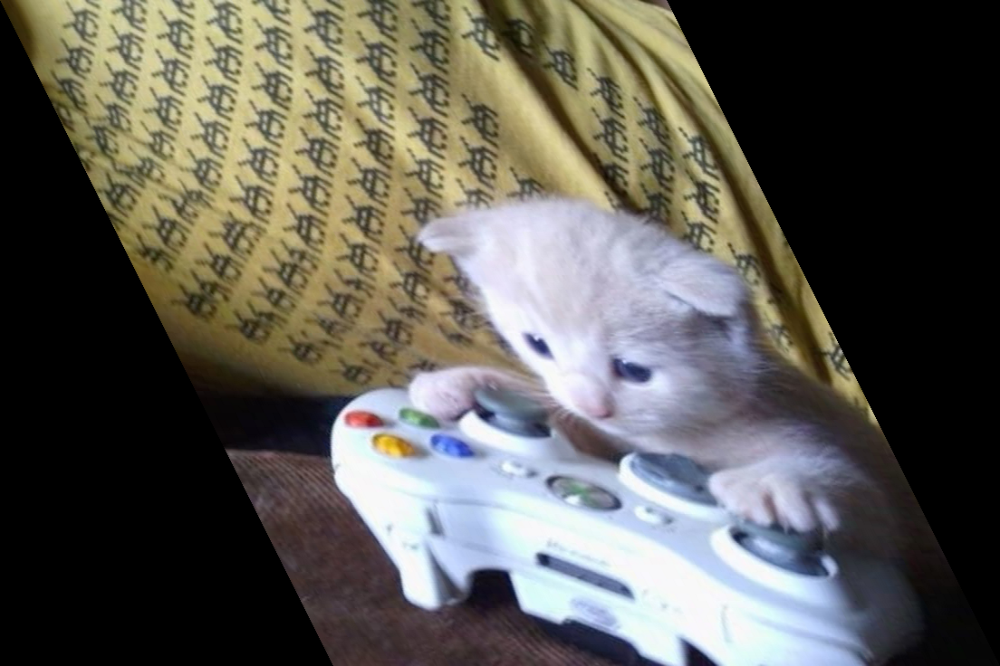

In [13]:
# -- e. Apply the shear transformation to the image ──────────────────────────
# PIL's transform() takes the inverse affine matrix:
# [ 1    shx   tx ]
# [ shy  1     ty ]
sheared_img = img.transform(
    (new_width, height),
    Image.Transform.AFFINE,
    shear_matrix,
    resample=Image.Resampling.BICUBIC
)

sheared_img

In [14]:
# -- f. Save the sheared image(The new image name should be "task1_3_sheared.jpg") 

sheared_img.save("task1_3_sheared.jpg")

print("Original size:", img.size)
print("Sheared size:", sheared_img.size)

Original size: (736, 736)
Sheared size: (1104, 736)


### Experiment and compare
Try these:

— Change shear factor from 0.5 to 0.1, 0.3, 0.8 and compare results

— Switch from X-axis to Y-axis shear matrix

— Update the canvas multiplier to match your new factor

— Try combining X and Y shear in one matrix

X-axis shear factor = 0.1


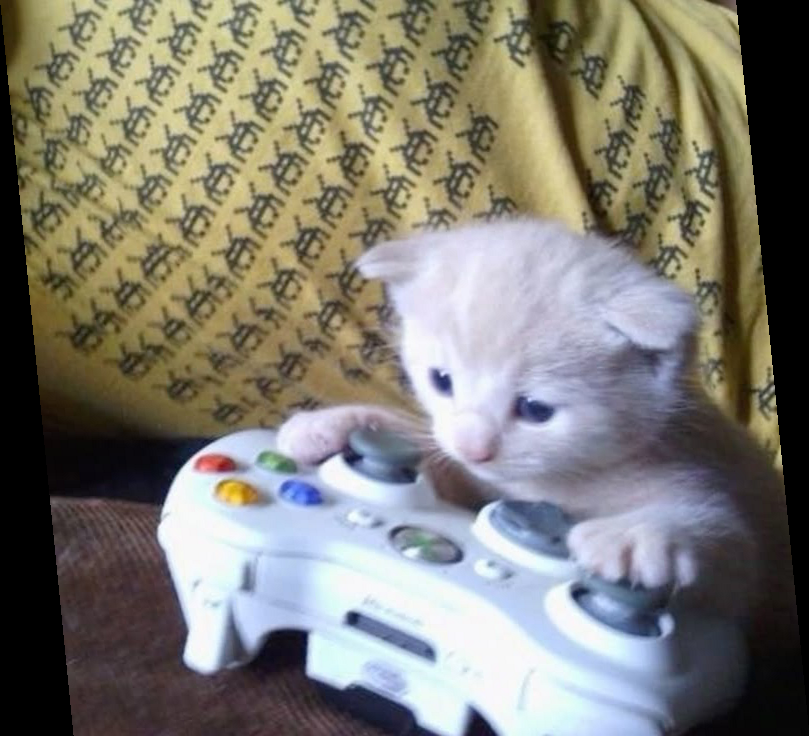

X-axis shear factor = 0.3


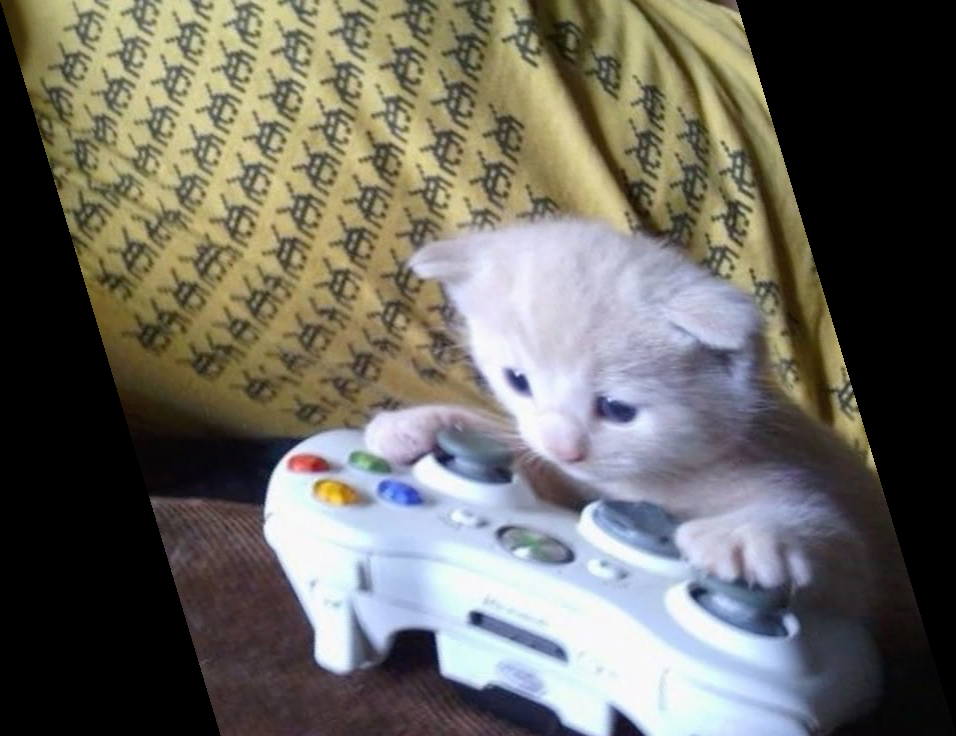

X-axis shear factor = 0.8


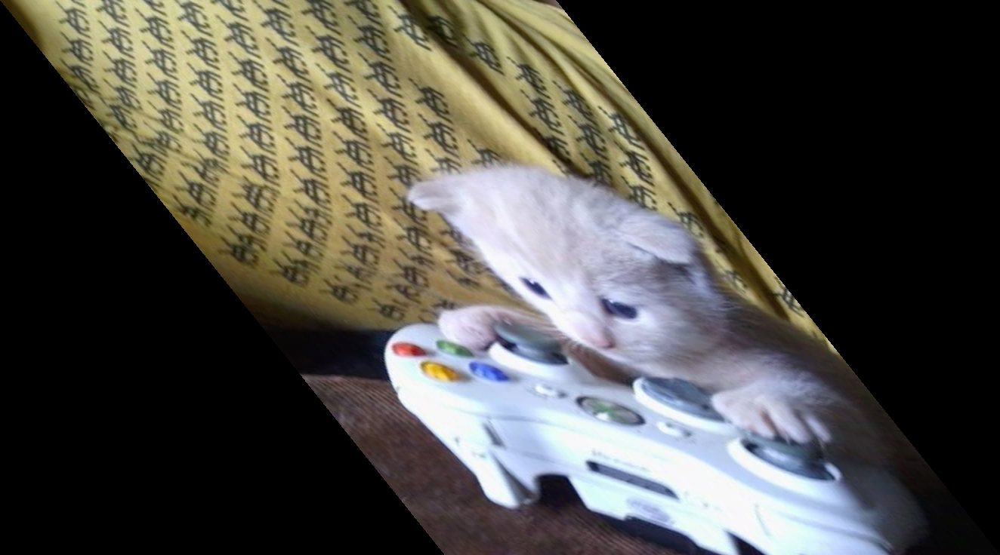

In [15]:

factors = [0.1, 0.3, 0.8]

for shx in factors:
    new_width = int(width + shx * height)

    sheared = img.transform(
        (new_width, height),
        Image.Transform.AFFINE,
        (1, -shx, 0, 0, 1, 0),
        resample=Image.Resampling.BICUBIC
    )

    print(f"X-axis shear factor = {shx}")
    display(sheared)

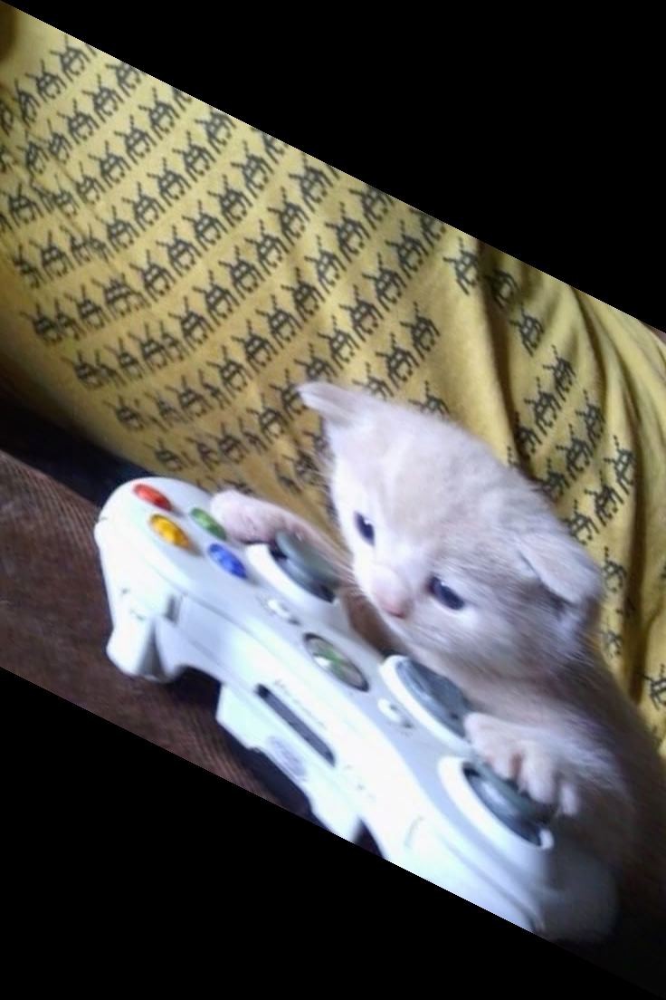

In [16]:
shy = 0.5

new_height = int(height + shy * width)

y_sheared = img.transform(
    (width, new_height),
    Image.Transform.AFFINE,
    (1, 0, 0, -shy, 1, 0),
    resample=Image.Resampling.BICUBIC
)

display(y_sheared)

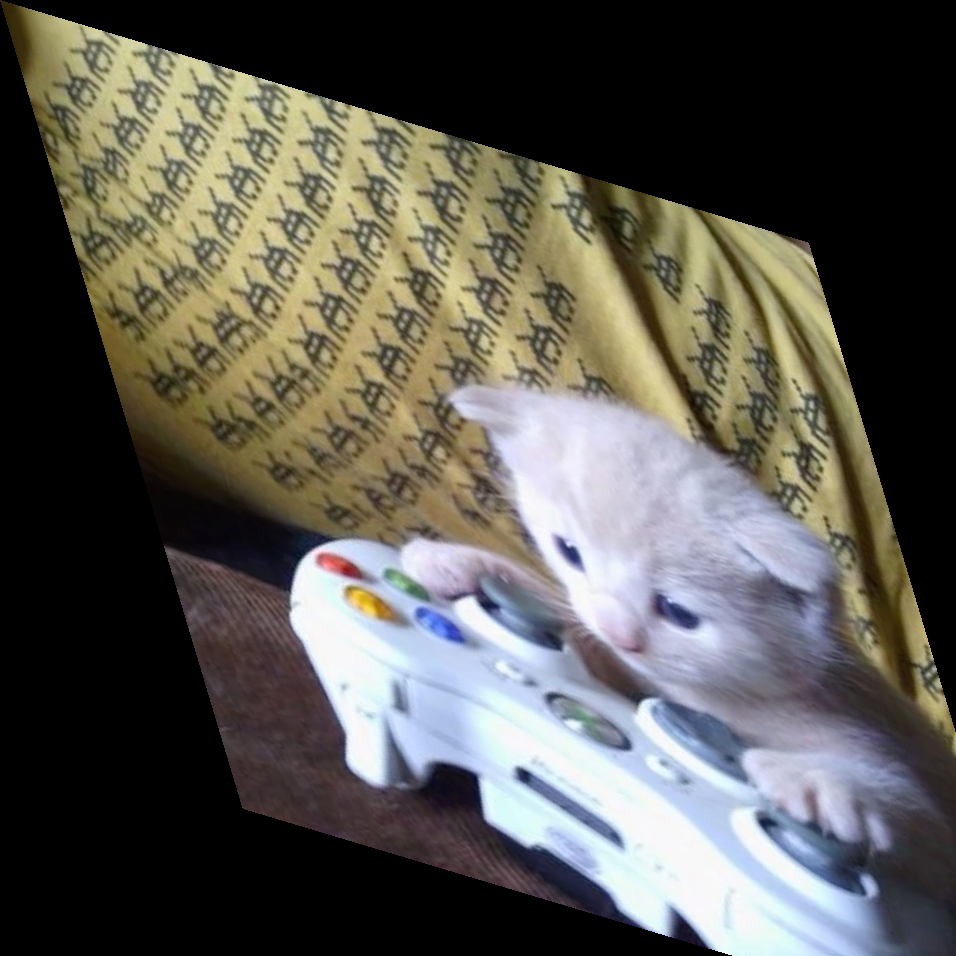

In [17]:
shx = 0.3
shy = 0.3

new_width = int(width + shx * height)
new_height = int(height + shy * width)

xy_sheared = img.transform(
    (new_width, new_height),
    Image.Transform.AFFINE,
    (1, -shx, 0, -shy, 1, 0),
    resample=Image.Resampling.BICUBIC
)

display(xy_sheared)

# Intensity Transformations
Negative · Log · Power Law (Gamma)

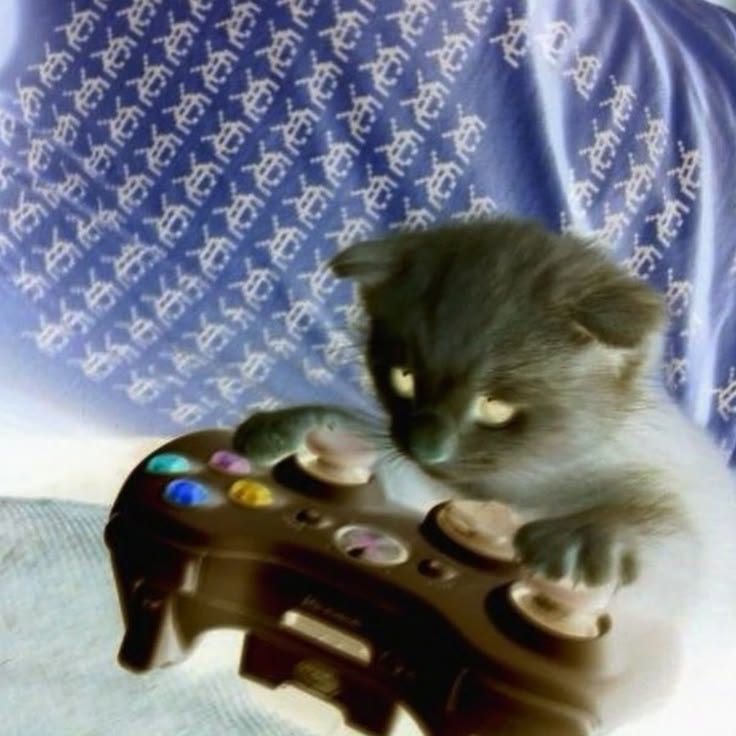

In [18]:

# ── 1. Negative ──────────────────────────────────── 
# Method 1: NumPy array manipulation
img_array = np.array(img)

negative_array = 255 - img_array

negative_img = Image.fromarray(negative_array)

display(negative_img)



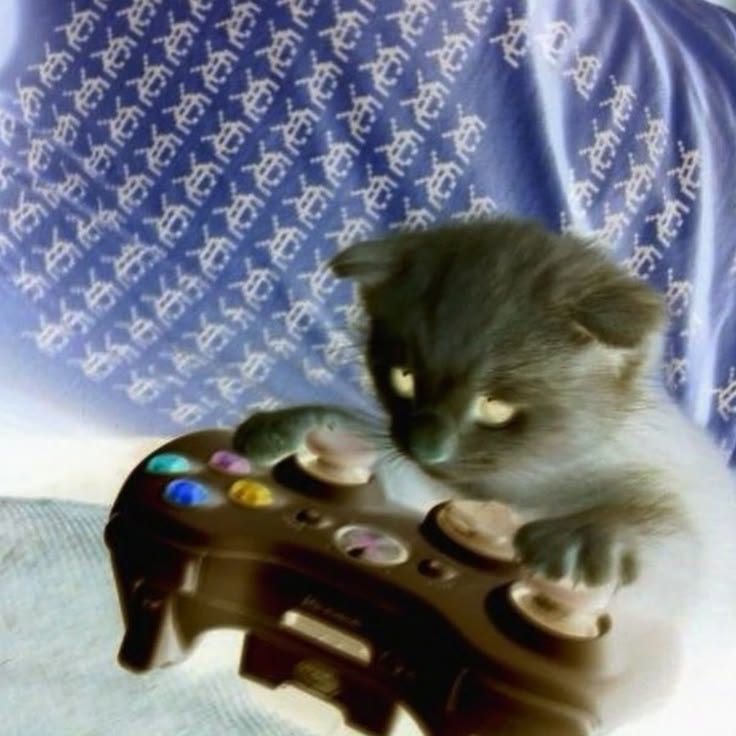

In [19]:
# Method 2: PIL's ImageOps
negative_img2 = ImageOps.invert(img)

display(negative_img2)

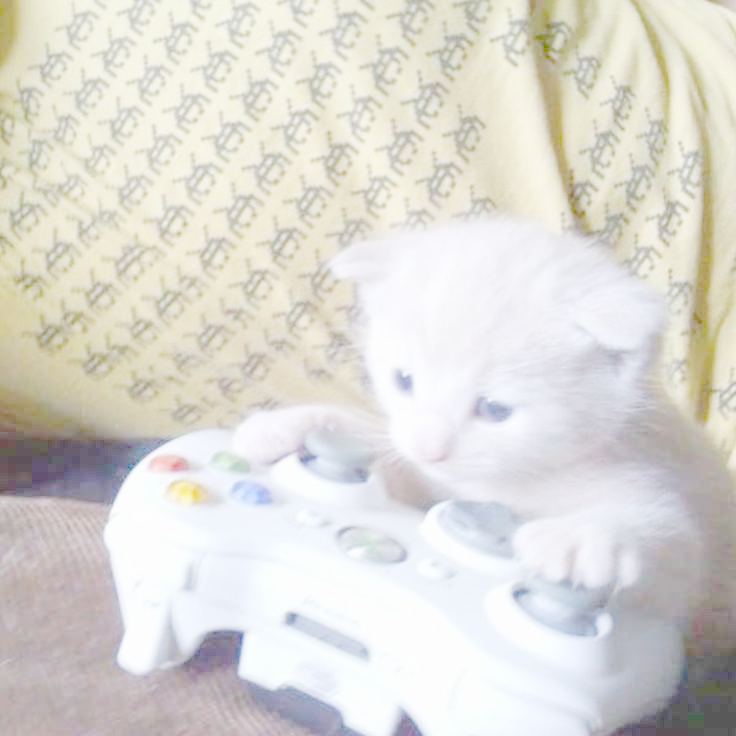

In [20]:
# ── 2. Log transformation ──────────────────────────

# s = c · log(1 + r) --> We need to find c.
# We want the maximum output value (s) to be 255 when the maximum input value (r) is 255:
# 255 = c · log(1 + 255)
# c = 255 / log(1 + 255)

arr = np.array(img).astype(np.float32)

c = 255 / np.log(1 + 255)

# Apply the log transformation to each pixel
log_transformed_arr = c * np.log(1 + arr)

log_transformed_arr = np.uint8(log_transformed_arr)

log_transformed_img = Image.fromarray(log_transformed_arr)

display(log_transformed_img)


In [ ]:

# ── 3. Power-law / Gamma correction ───────────────


Gamma = 0.5


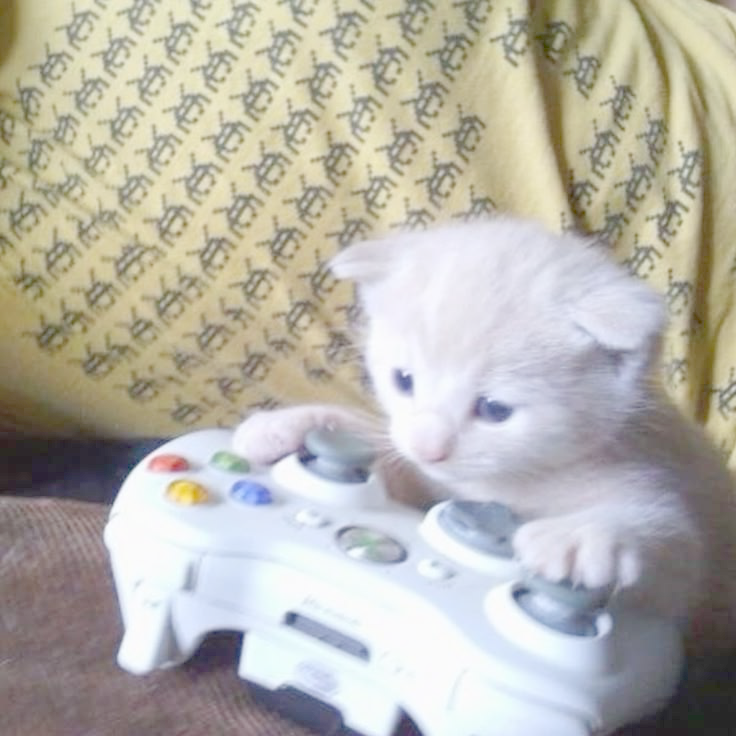

Gamma = 1


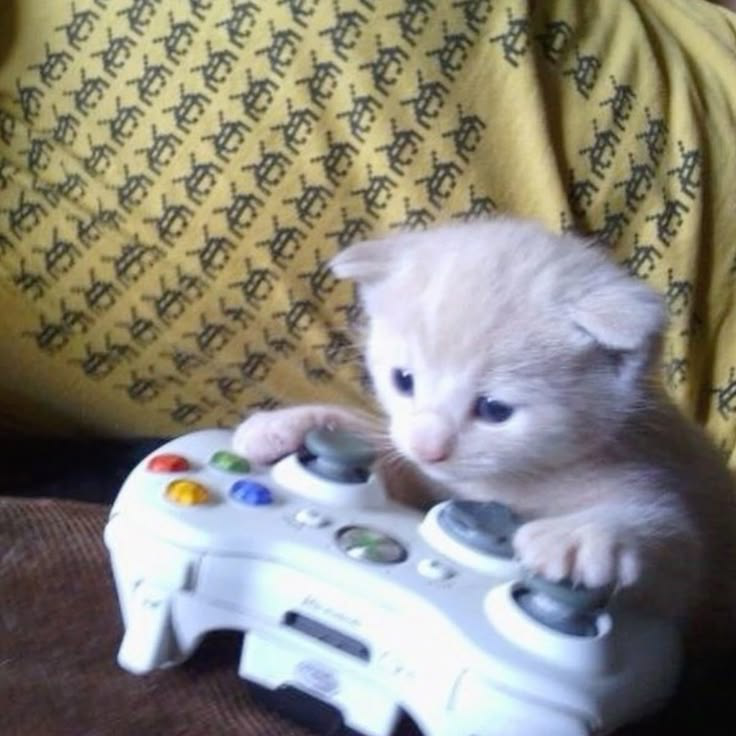

Gamma = 2


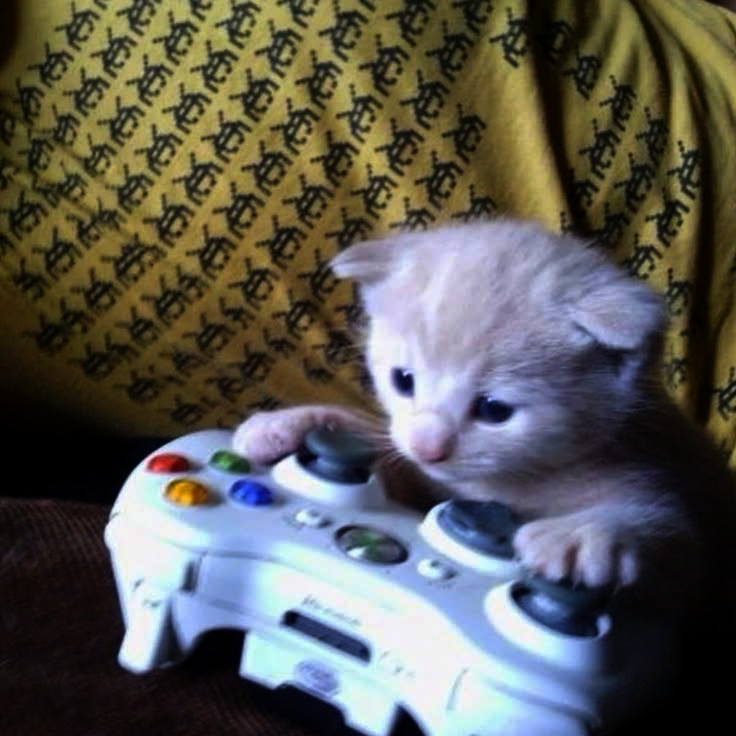

In [22]:
arr = np.array(img).astype(np.float32) / 255.0

for gamma in [0.5, 1, 2]:
    gamma_corrected = 255 * (arr ** gamma)
    gamma_img = Image.fromarray(np.uint8(gamma_corrected))

    print("Gamma =", gamma)
    display(gamma_img)